In [1]:
import numpy as np
import matplotlib
import sys, platform, os
import matplotlib.cm as cm
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import astropy.io.fits as fits
import camb

from camb import model, initialpower

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

from PolAngle import *
from beam import * 
from map import *
from convolution import * 
from beam_class import *

Passaggi     = Power spectrum T, E, B -> Mappe E, B -> Mappe Q,U -> Peturbazione Q_pert, U_pert -> Mappe E_pert, B_pert ->
               PS T2, E2, B2, E_pert, B_pert

Confronto PS = E, E2, E_pert ----
               B, B2, B_pert
               
------------------------------------------

T, E, B sono i PS originali

T2, E2, B2 sono i PS ricavati dalle mappe originali


E_pert, B_pert sono i PS ricavati dalle mappe perturbate

# Power spectrum

In [2]:
Original_PS = np.loadtxt('Original_PS_001.txt')

In [3]:
TT_ps  = Original_PS[0]
TE_ps  = Original_PS[1]
EE_ps  = Original_PS[2]
BB_ps  = Original_PS[3]
BB_ps_tensor  = Original_PS[4]

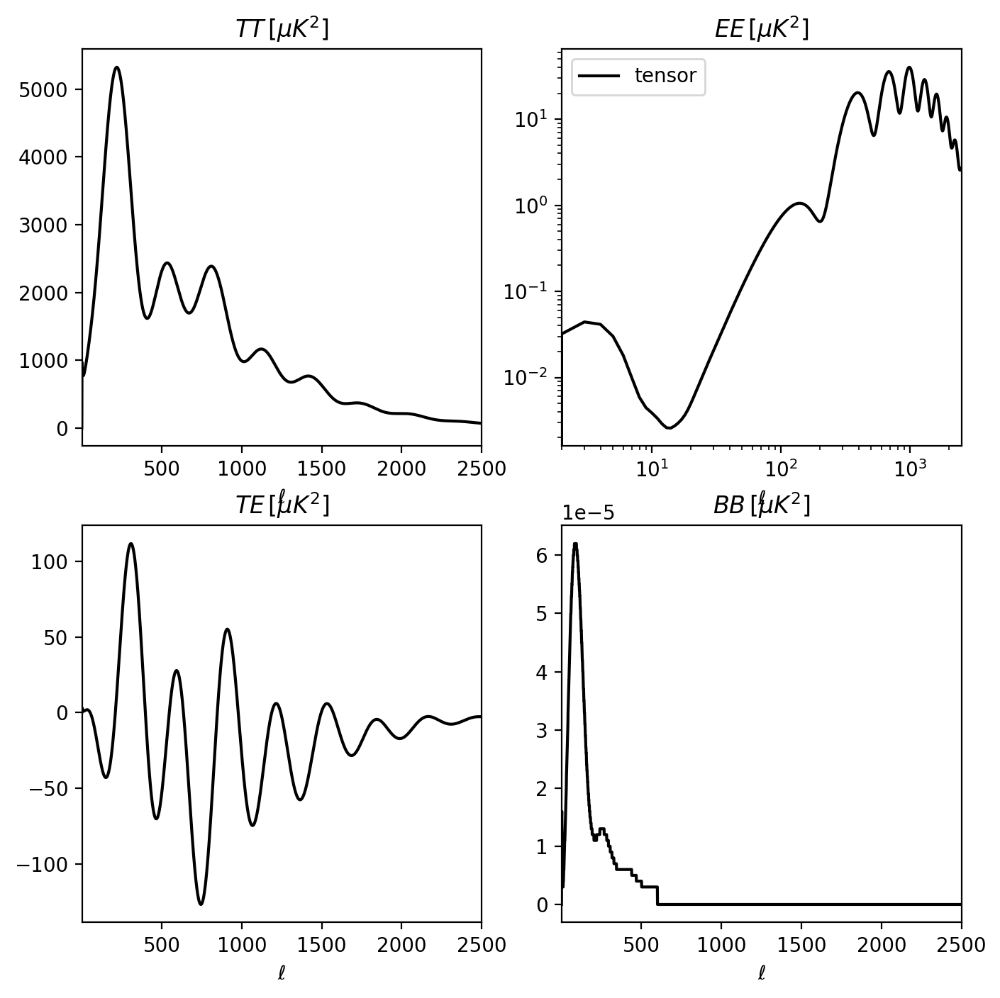

In [4]:
#plot the total lensed CMB power spectra versus unlensed, and fractional difference

ls = np.arange(TT_ps.shape[0])
fig, ax = plt.subplots(2,2, figsize = (8,8))

# TT
ax[0,0].plot(ls,TT_ps, color='k')
ax[0,0].set_title(r'$TT\, [\mu K^2]$')

#TE
ax[1,0].plot(ls,TE_ps, color='k')
ax[1,0].set_title(r'$TE\, [\mu K^2]$')

#EE
ax[0,1].loglog(ls,EE_ps, color='k', label="tensor")
ax[0,1].set_title(r'$EE\, [\mu K^2]$')
ax[0,1].legend()

# BB
ax[1,1].plot(ls,BB_ps_tensor, color='k')
ax[1,1].set_title(r'$BB\, [\mu K^2]$')

for ax in ax.reshape(-1): 
    ax.set_xlim([2,2500])
    ax.set_xlabel(r'$\ell$')

# Mappe E, B, Q, U

In [5]:
# parametri mappa

pix_size = 0.5    #arcmin
N        = 2**10  #num pixel lineare
X_width, Y_width = N*pix_size/60., N*pix_size/60.   #dimensioni mappa in gradi

c_min, c_max     = -200, 200                        #color map

#se voglio invece partire da una dimensione fissata di mappa e pixel, uso questa formula per trovare quanti pixel mi servono
#N = (X_width * 60)/ pix_size #pixel number

print(f"Mappa con {N} x {N} pixels, ognuno di {pix_size} arcmin, per una dimensione totale di {X_width:.2f} x {Y_width:.2f} gradi")


nbig = 5000

Mappa con 1024 x 1024 pixels, ognuno di 0.5 arcmin, per una dimensione totale di 8.53 x 8.53 gradi


In [6]:
# MAPPE ORIGINALI

ell_big = np.arange(nbig)

TT_ps_big = np.zeros(nbig)
TT_ps_big[ls.astype(int)] = TT_ps

EE_ps_big = np.zeros(nbig)
EE_ps_big[ls.astype(int)] = EE_ps

BB_ps_big = np.zeros(nbig)
BB_ps_big[ls.astype(int)] = BB_ps_tensor

TE_ps_big = np.zeros(nbig)
TE_ps_big[ls.astype(int)] = TE_ps

ell    = ell_big
ps_TT  = TT_ps_big + 1e-3   
ps_EE  = EE_ps_big + 1e-3
ps_BB  = BB_ps_big + 1e-3
ps_TE  = TE_ps_big

Temp_point_source_spectrum = ps_TT[1000]*(ell/3000.)**2.
Pol_point_source_spectrum  = ps_EE[1500]*(ell/4500.)**2.

ps_TT = ps_TT + Temp_point_source_spectrum  
ps_EE = ps_EE + Pol_point_source_spectrum
ps_BB = ps_BB + Pol_point_source_spectrum

In [7]:
# mappe originali
T_map, Q_map, U_map, E_map, B_map = make_CMB_maps(N,pix_size,ell,ps_TT,ps_EE,ps_TE,ps_BB)

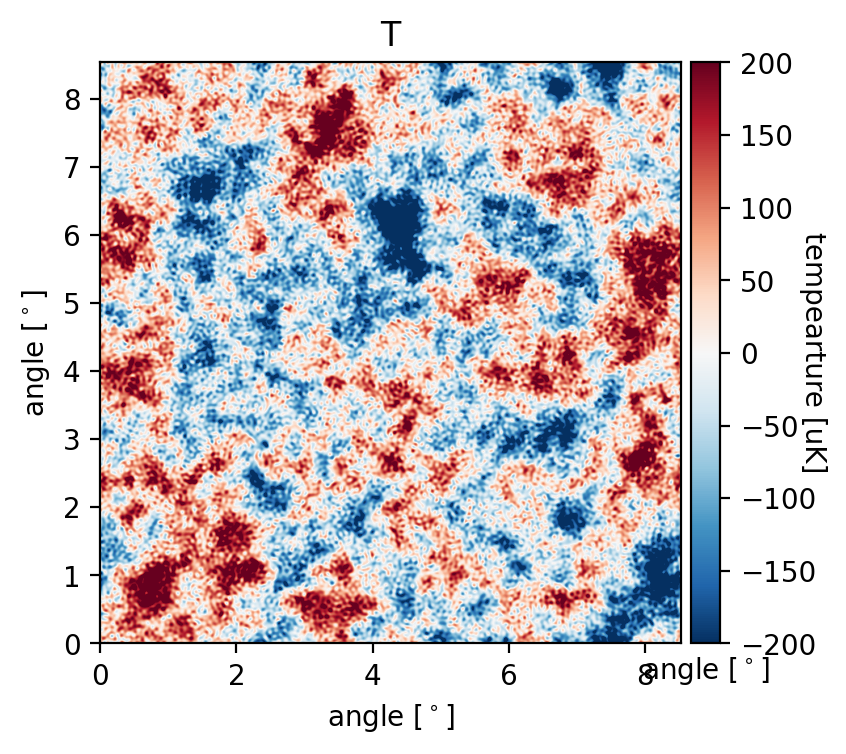

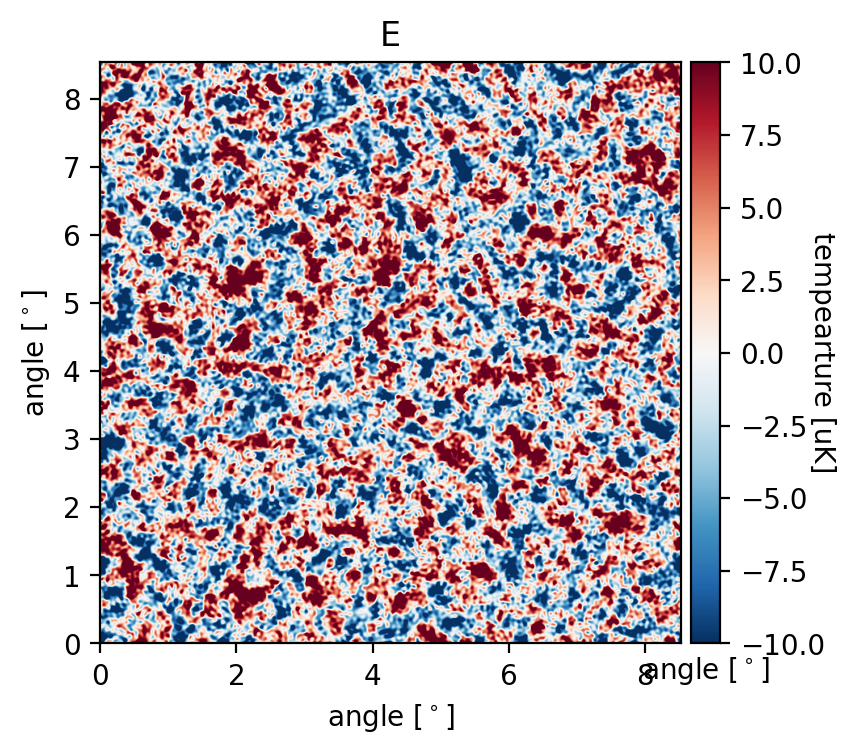

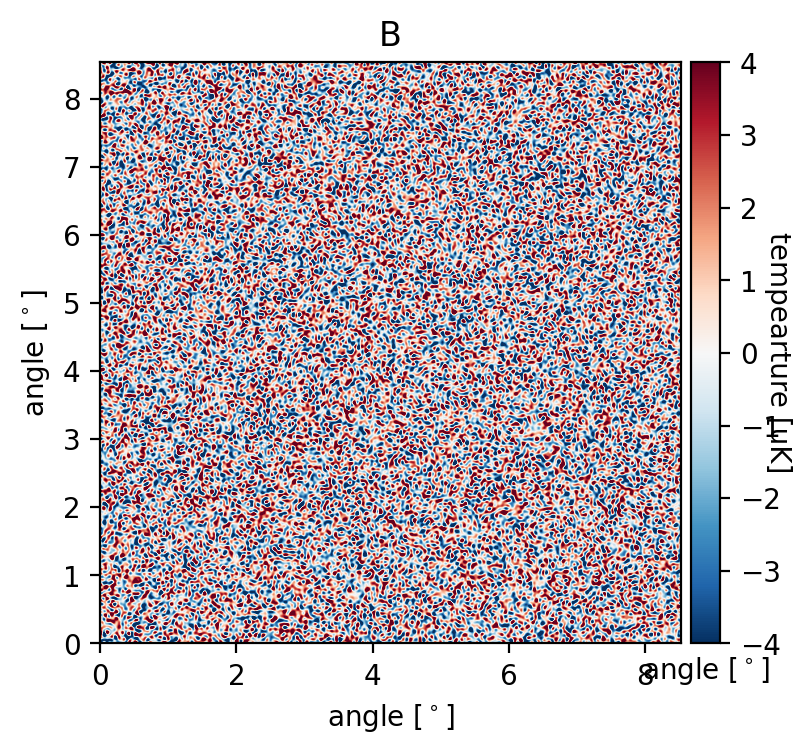

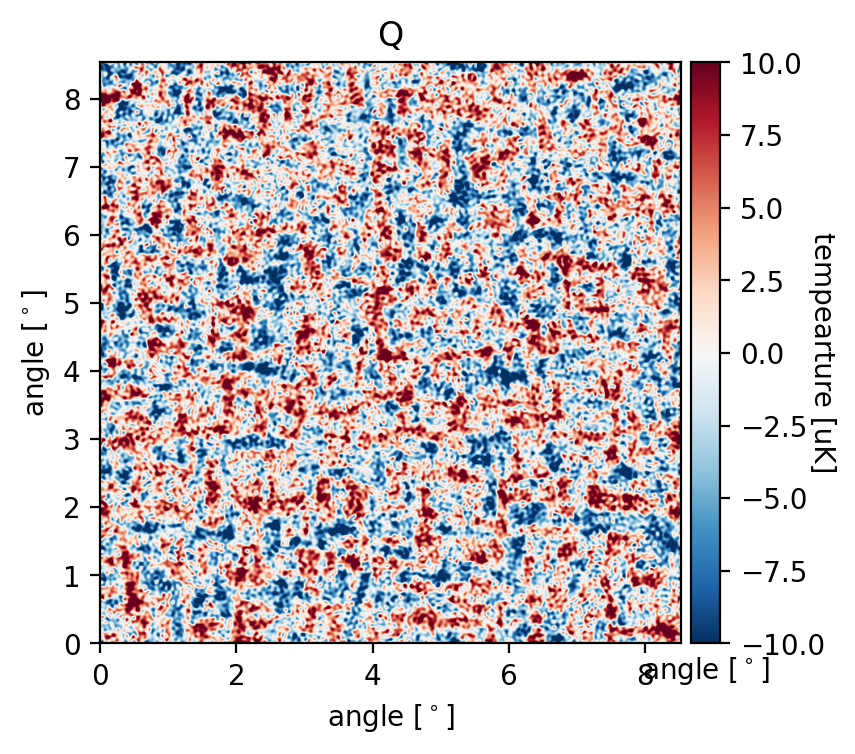

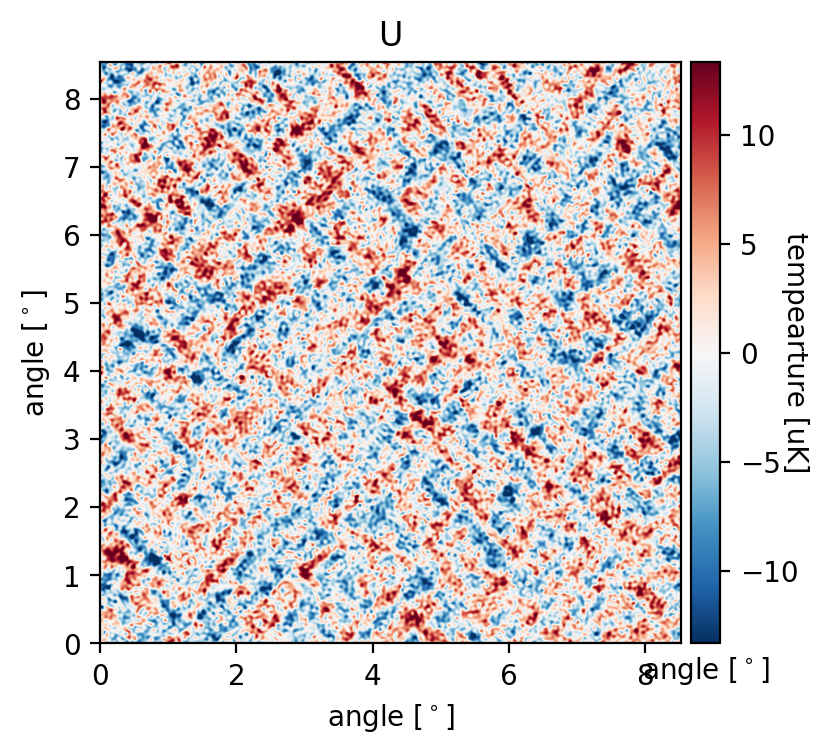

In [8]:
# MAPPE ORIGINALI

plt.title("T")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(T_map,c_min,c_max,X_width,Y_width)

plt.title("E")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(E_map,c_min/20.,c_max/20.,X_width,Y_width)

plt.title("B")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(B_map,c_min/50.,c_max/50.,X_width,Y_width)

plt.title("Q")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(Q_map ,c_min/20.,c_max/20.,X_width,Y_width)

plt.title("U")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(U_map,c_min/15.,c_max/15.,X_width,Y_width)

# PERTURBAZIONE MAPPE

In [9]:
'''
def polangle_map(Q_map, U_map, gauss_center, std_deviation):
    pol_angle  = np.zeros_like(Q_map)
    pol_angle  = np.random.normal(gauss_center, std_deviation, pol_angle.shape)
    Q_map_pert = Q_map * np.cos(2*pol_angle) + U_map * np.sin(2*pol_angle)
    U_map_pert = U_map * np.cos(2*pol_angle) + Q_map * np.sin(2*pol_angle)
    
    return (Q_map_pert, U_map_pert)
'''

'\ndef polangle_map(Q_map, U_map, gauss_center, std_deviation):\n    pol_angle  = np.zeros_like(Q_map)\n    pol_angle  = np.random.normal(gauss_center, std_deviation, pol_angle.shape)\n    Q_map_pert = Q_map * np.cos(2*pol_angle) + U_map * np.sin(2*pol_angle)\n    U_map_pert = U_map * np.cos(2*pol_angle) + Q_map * np.sin(2*pol_angle)\n    \n    return (Q_map_pert, U_map_pert)\n'

In [10]:
std_deviation_gradi = 0.1
std_deviation_rad   = std_deviation_gradi * np.pi / 180
gauss_center  = 0

print(std_deviation_rad)

0.0017453292519943296


In [11]:
Q_map_pert, U_map_pert = polangle_map(Q_map, U_map, gauss_center, std_deviation_rad)

In [12]:
# APODIZZAZIONE
window = (cosine_window(N))

Q_map_pert_ap = window * Q_map_pert 
U_map_pert_ap = window * U_map_pert 

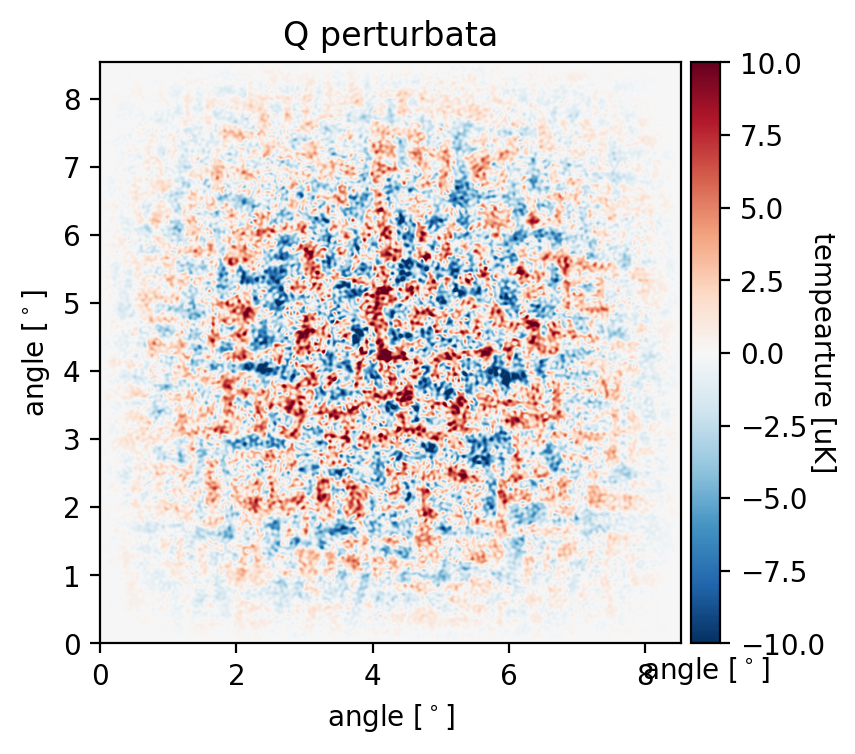

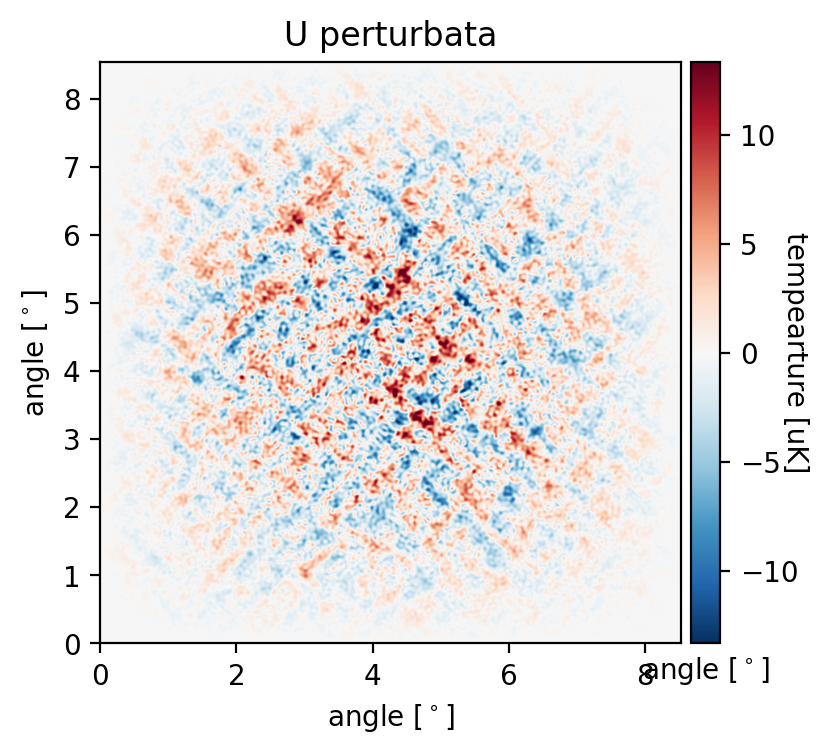

In [13]:
# MAPPE PERTURBATE

plt.title("Q perturbata")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(Q_map_pert_ap ,c_min/20.,c_max/20.,X_width,Y_width)

plt.title("U perturbata")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(U_map_pert_ap,c_min/15.,c_max/15.,X_width,Y_width)

# Polarizzazione

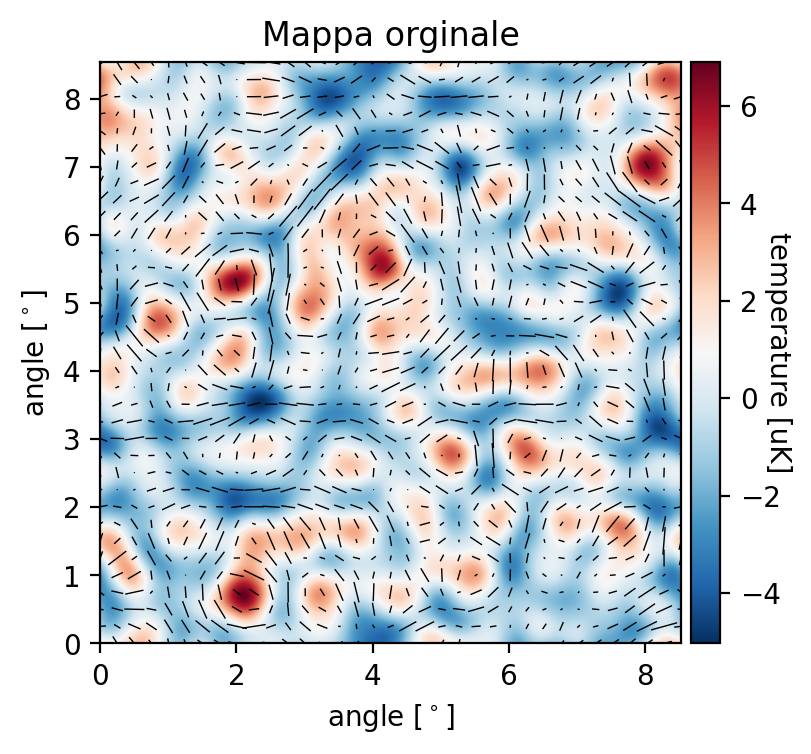

In [14]:
title_og = "Mappa orginale"
pol_map  = plotquiver(N,Q_map,U_map,X_width,Y_width, pix_size,title_og,background=E_map)

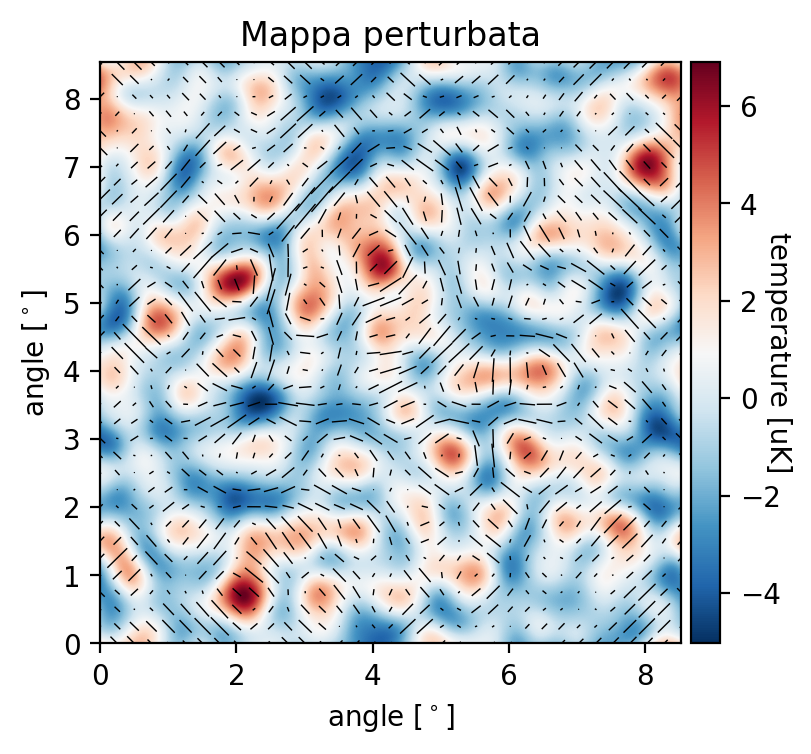

In [15]:
title_pert = "Mappa perturbata"
pol_map_pert = plotquiver(N,Q_map_pert_ap,U_map_pert,X_width,Y_width, pix_size, title_pert,background=E_map)

### Da mappe Q,U a mappe E,B

In [16]:
E_map_pert, B_map_pert = QU2EB(N,pix_size,Q_map_pert,U_map_pert)
E_map_pert_ap, B_map_pert_ap = QU2EB(N,pix_size,Q_map_pert_ap,U_map_pert_ap)

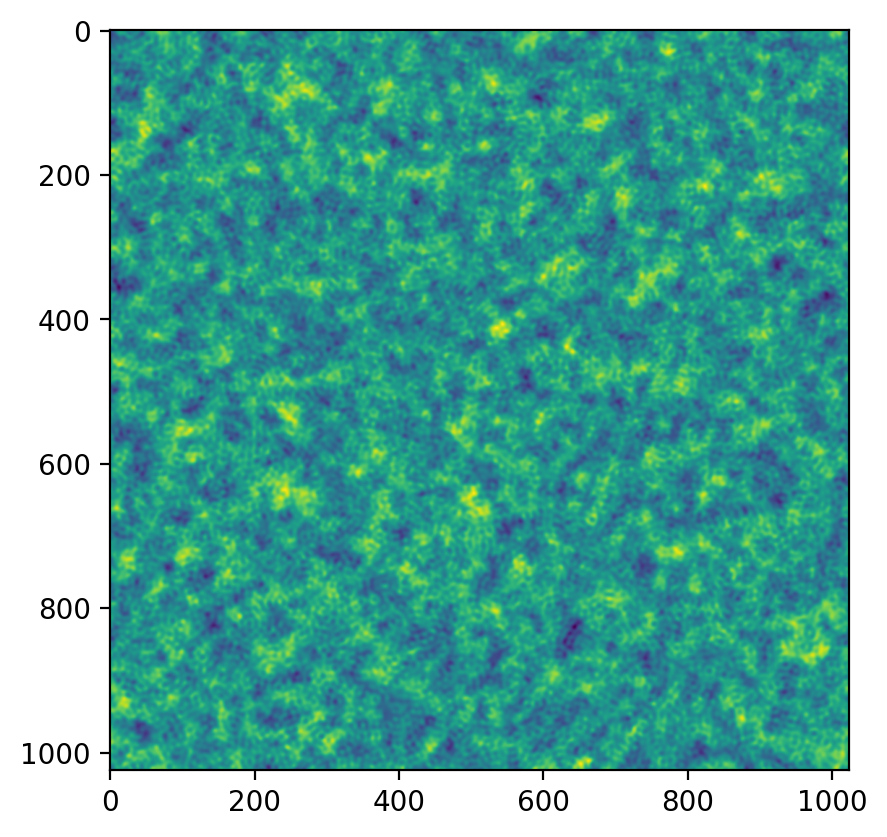

In [17]:
plt.imshow(E_map_pert)

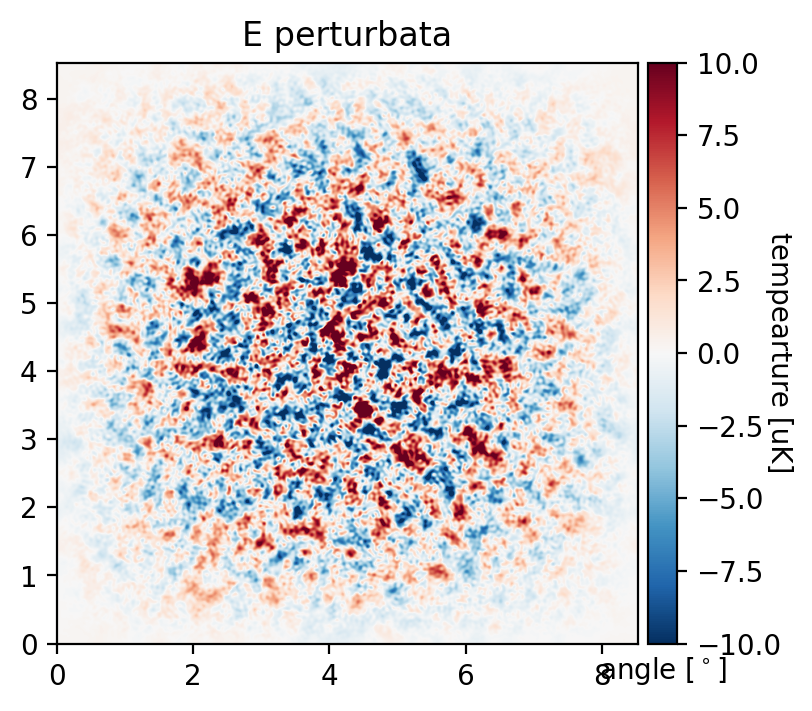

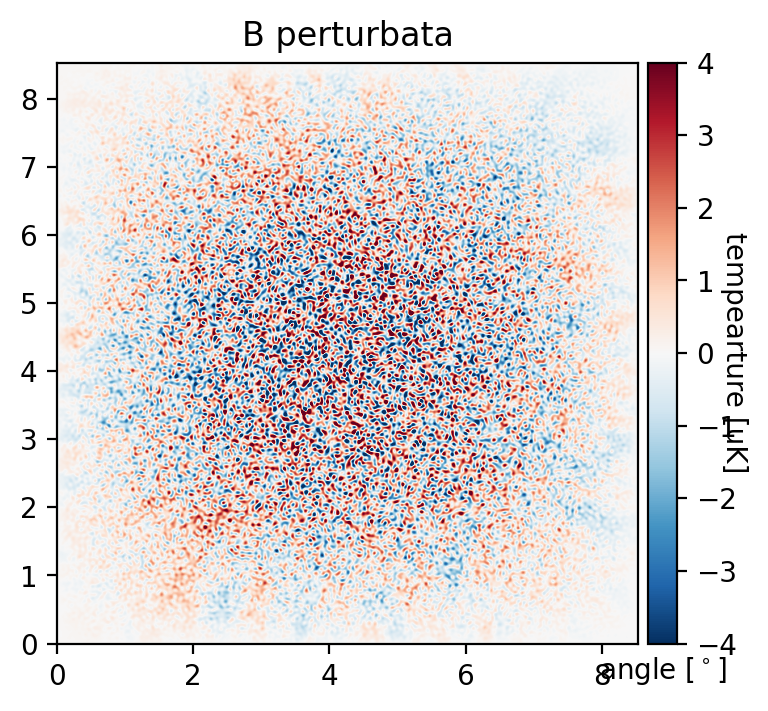

0

In [18]:
plt.title("E perturbata")
Plot_CMB_Map(E_map_pert_ap,c_min/20.,c_max/20.,X_width,Y_width)

plt.title("B perturbata")
Plot_CMB_Map(B_map_pert_ap,c_min/50.,c_max/50.,X_width,Y_width)

# Analysis

In [19]:
delta_l = 50.
l_max   = 2500

binned_l_T, binned_spectrum_T = calculate_2d_spectrum(T_map,T_map,delta_l,l_max,pix_size,N)
binned_l_E, binned_spectrum_E = calculate_2d_spectrum(E_map,E_map,delta_l,l_max,pix_size,N)
binned_l_B, binned_spectrum_B = calculate_2d_spectrum(B_map,B_map,delta_l,l_max,pix_size,N)

binned_l_E_pert, binned_spectrum_E_pert = calculate_2d_spectrum(E_map_pert_ap,E_map_pert_ap,delta_l,l_max,pix_size,N)
binned_l_B_pert, binned_spectrum_B_pert = calculate_2d_spectrum(B_map_pert_ap,B_map_pert_ap,delta_l,l_max,pix_size,N)

In [20]:
# ci mette un po' (un paio di minuti)

beam_size_fwhp    = 1.25
white_noise_level = 0.5
atmospheric_noise_level = 0.1 * 0 #azzerato
one_over_f_noise_level  = 0.2 * 0 #azzerato

# TRANSFER FUNCTION - multiplicative bias
N_iterations  = 16
signal_only_T = np.zeros([N_iterations,int(l_max/delta_l)])
signal_only_E = np.zeros([N_iterations,int(l_max/delta_l)])
signal_only_B = np.zeros([N_iterations,int(l_max/delta_l)])
signal_only_E_pert = np.zeros([N_iterations,int(l_max/delta_l)])
signal_only_B_pert = np.zeros([N_iterations,int(l_max/delta_l)])

i = 0

while (i < N_iterations):
    #map_T, map_Q, map_U, map_E, map_B = make_CMB_maps(N,pix_size,ls,TT_ps,EE_ps,TE_ps,BB_ps)
    #map_T_pert, map_Q_pert, map_U_pert, map_E_pert, map_B_pert = make_CMB_maps(N,pix_size,ls,TT_ps,EE_ps_pert,TE_ps,BB_ps_pert)
    
    
    map_convolved_T = convolve_map_with_gaussian_beam(N,pix_size,beam_size_fwhp,T_map)
    map_convolved_E = convolve_map_with_gaussian_beam(N,pix_size,beam_size_fwhp,E_map)
    map_convolved_B = convolve_map_with_gaussian_beam(N,pix_size,beam_size_fwhp,B_map)
        
    map_convolved_E_pert = convolve_map_with_gaussian_beam(N,pix_size,beam_size_fwhp,E_map_pert_ap)
    map_convolved_B_pert = convolve_map_with_gaussian_beam(N,pix_size,beam_size_fwhp,B_map_pert_ap)
    
    binned_l_cur_T, binned_spectrum_cur_T = calculate_2d_spectrum(map_convolved_T*window, map_convolved_T*window,delta_l,l_max,pix_size,N)
    binned_l_cur_E, binned_spectrum_cur_E = calculate_2d_spectrum(map_convolved_E*window, map_convolved_E*window,delta_l,l_max,pix_size,N)
    binned_l_cur_B, binned_spectrum_cur_B = calculate_2d_spectrum(map_convolved_B*window, map_convolved_B*window,delta_l,l_max,pix_size,N)
   
    binned_l_cur_E_pert, binned_spectrum_cur_E_pert = calculate_2d_spectrum(map_convolved_E_pert*window, map_convolved_E_pert*window,delta_l,l_max,pix_size,N)
    binned_l_cur_B_pert, binned_spectrum_cur_B_pert = calculate_2d_spectrum(map_convolved_B_pert*window, map_convolved_B_pert*window,delta_l,l_max,pix_size,N)
    
    signal_only_T[i,:] = binned_spectrum_cur_T
    sys.stdout.flush()
    signal_only_E[i,:] = binned_spectrum_cur_E
    sys.stdout.flush()
    signal_only_B[i,:] = binned_spectrum_cur_B
    sys.stdout.flush()
    signal_only_E_pert[i,:] = binned_spectrum_cur_E_pert
    sys.stdout.flush()
    signal_only_B_pert[i,:] = binned_spectrum_cur_B_pert
    sys.stdout.flush()
    i = i + 1
    
sig_only_mean_spectrum_T, rms_T = average_N_spectra(signal_only_T,N_iterations,int(l_max/delta_l))
sig_only_mean_spectrum_E, rms_E = average_N_spectra(signal_only_E,N_iterations,int(l_max/delta_l))
sig_only_mean_spectrum_B, rms_B = average_N_spectra(signal_only_B,N_iterations,int(l_max/delta_l))
sig_only_mean_spectrum_E_pert, rms_E_pert = average_N_spectra(signal_only_E_pert,N_iterations,int(l_max/delta_l))
sig_only_mean_spectrum_B_pert, rms_B_pert = average_N_spectra(signal_only_B_pert,N_iterations,int(l_max/delta_l))


sub_sampled_CLs_T = Original_PS[0][binned_l_T] * 2. * np.pi / (binned_l_T * (binned_l_T+1.))
sub_sampled_CLs_E = Original_PS[2][binned_l_E] * 2. * np.pi / (binned_l_E * (binned_l_E+1.))
sub_sampled_CLs_B = BB_ps_tensor[binned_l_B] * 2. * np.pi / (binned_l_B * (binned_l_B+1.))
sub_sampled_CLs_E_pert = Original_PS[2][binned_l_E_pert] * 2. * np.pi / (binned_l_E_pert * (binned_l_E_pert+1.))
sub_sampled_CLs_B_pert = BB_ps_tensor[binned_l_B_pert] * 2. * np.pi / (binned_l_B_pert * (binned_l_B_pert+1.))

# ho cambiato TT_ps etc con Original_PS[0]
Multiplicative_Bias_est_T =  sub_sampled_CLs_T / sig_only_mean_spectrum_T
Multiplicative_Bias_est_E =  sub_sampled_CLs_E / sig_only_mean_spectrum_E
Multiplicative_Bias_est_B =  sub_sampled_CLs_B / sig_only_mean_spectrum_B
Multiplicative_Bias_est_E_pert =  sub_sampled_CLs_E_pert / sig_only_mean_spectrum_E_pert
Multiplicative_Bias_est_B_pert =  sub_sampled_CLs_B_pert / sig_only_mean_spectrum_B_pert



# NOISE - noise bias
noise_only = np.zeros([N_iterations,int(l_max/delta_l)])
i = 0

while (i <N_iterations):
    Noise = make_noise_map(N,pix_size,white_noise_level,atmospheric_noise_level,one_over_f_noise_level)
    binned_l_cur, binned_spectrum_cur = calculate_2d_spectrum(Noise*window,Noise*window,delta_l,l_max,pix_size,N)
    
    noise_only[i,:] = binned_spectrum_cur
    sys.stdout.flush()
    i = i + 1

noise_only_mean_spectrum, rms_not_needed = average_N_spectra(noise_only,N_iterations,int(l_max/delta_l))
Additive_Bias_est = noise_only_mean_spectrum

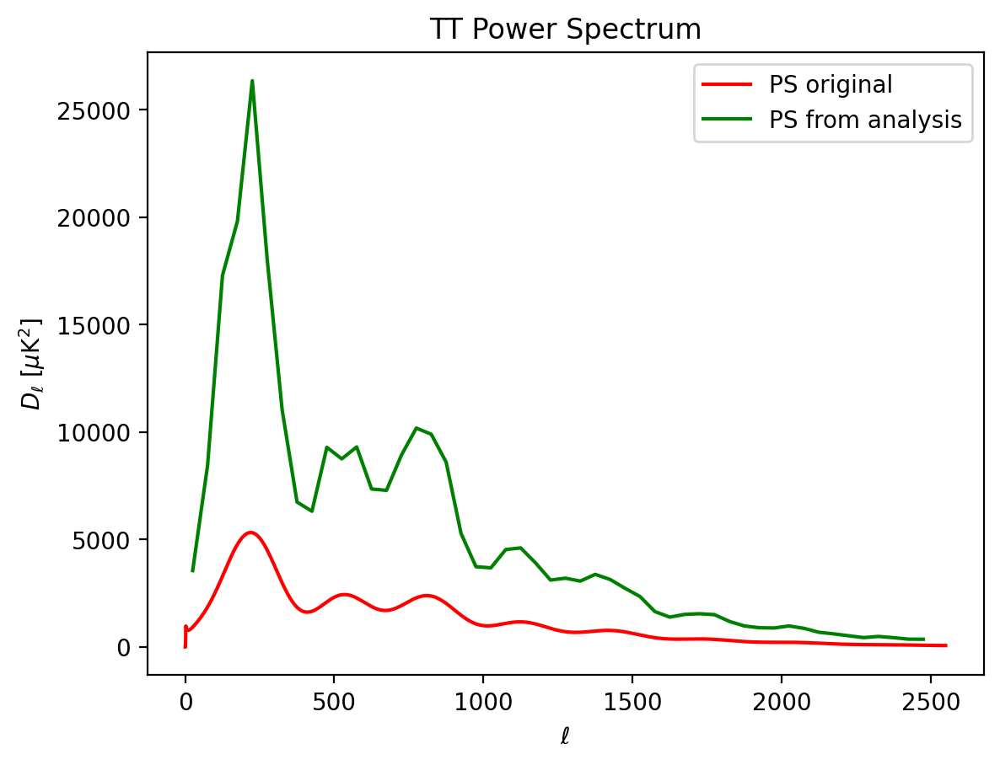

In [21]:
#plt.plot(binned_l_T,binned_spectrum_T* binned_l_T * (binned_l_T+1.)/2. / np.pi,color='b', label="PS from analysis")

plt.plot(ls,Original_PS[0], label="PS original", c="r")

plt.plot(binned_l_T,(binned_spectrum_T - noise_only_mean_spectrum) * Multiplicative_Bias_est_T*\
             binned_l_T * (binned_l_T+1.)/2. / np.pi,color='g', label="PS from analysis") #corretto

plt.title("TT Power Spectrum")
plt.ylabel('$D_{\ell}$ [$\mu$K$^2$]')
plt.xlabel('$\ell$')
plt.legend()

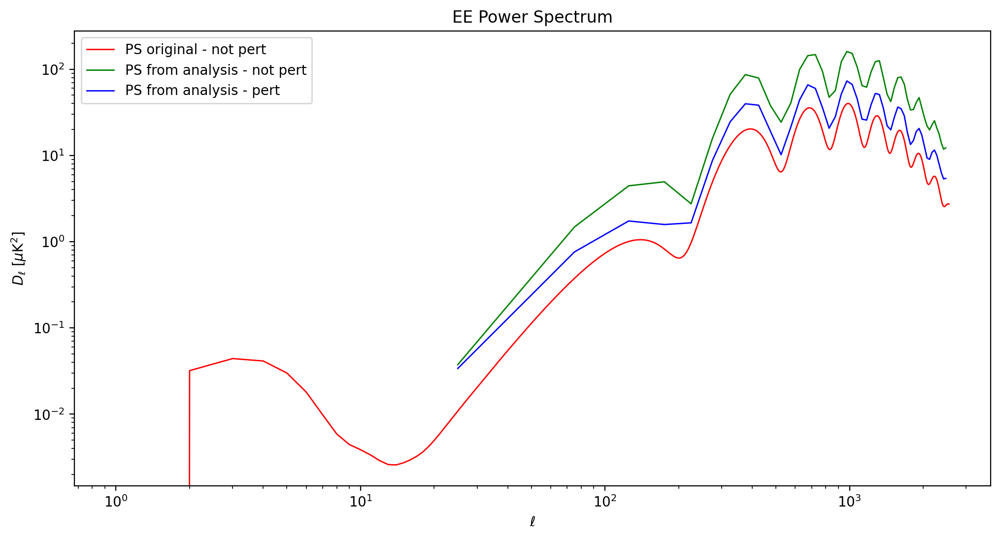

In [22]:
#plt.plot(binned_l_E,binned_spectrum_E* binned_l_E * (binned_l_E+1.)/2. / np.pi,color='b', label="PS from analysis")

plt.figure(figsize=(12, 6))

plt.loglog(ls,Original_PS[2], label="PS original - not pert", c="r", linewidth=1)
#plt.plot(ls,EE_ps_pert, label="PS original - pert", c="purple", linewidth=1)

plt.loglog(binned_l_E,(binned_spectrum_E - noise_only_mean_spectrum) * Multiplicative_Bias_est_E*\
             binned_l_E * (binned_l_E+1.)/2. / np.pi,color='green', label="PS from analysis - not pert", linewidth=1)

plt.loglog(binned_l_E_pert,(binned_spectrum_E_pert - noise_only_mean_spectrum) * Multiplicative_Bias_est_E_pert*\
             binned_l_E_pert * (binned_l_E_pert+1.)/2. / np.pi,color='blue', label="PS from analysis - pert", linewidth=1)


plt.title("EE Power Spectrum")
plt.ylabel('$D_{\ell}$ [$\mu$K$^2$]')
plt.xlabel('$\ell$')
plt.legend()

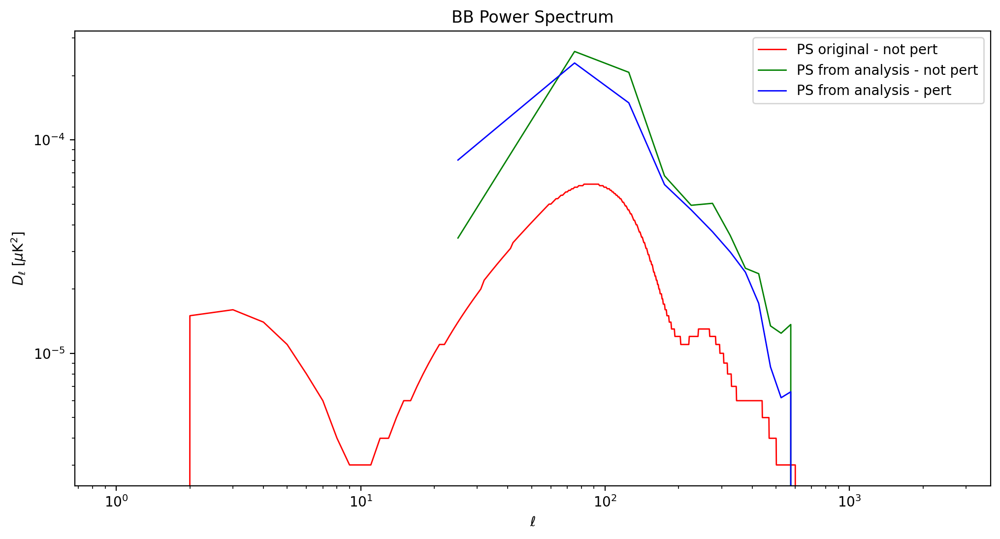

In [23]:
plt.figure(figsize=(12, 6))

plt.loglog(ls,BB_ps_tensor, label="PS original - not pert", c="r", linewidth=1)
#plt.plot(ls,BB_ps_pert, label="PS original - pert", c="purple", linewidth=1)

plt.loglog(binned_l_B,(binned_spectrum_B - noise_only_mean_spectrum) * Multiplicative_Bias_est_B*\
             binned_l_B * (binned_l_B +1.)/2. / np.pi,color='green', label="PS from analysis - not pert", linewidth=1)

plt.loglog(binned_l_B_pert,(binned_spectrum_B_pert - noise_only_mean_spectrum) * Multiplicative_Bias_est_B_pert*\
             binned_l_B_pert * (binned_l_B_pert+1.)/2. / np.pi,color='blue', label="PS from analysis - pert", linewidth=1)


plt.title("BB Power Spectrum")
plt.ylabel('$D_{\ell}$ [$\mu$K$^2$]')
plt.xlabel('$\ell$')
plt.legend()

# Immagini

Confronto EE_ps-EE_ps_pert e BB_ps-BB_ps_pert

Confronto E_map, B_map, Q_map, U_map, pol_map - E_map_pert, B_map_pert, Q_map_pert, U_map_pert, pol_map_pert in una sola immagine

Confronto tutti i PS E e tutti i PS B in una sola immagine

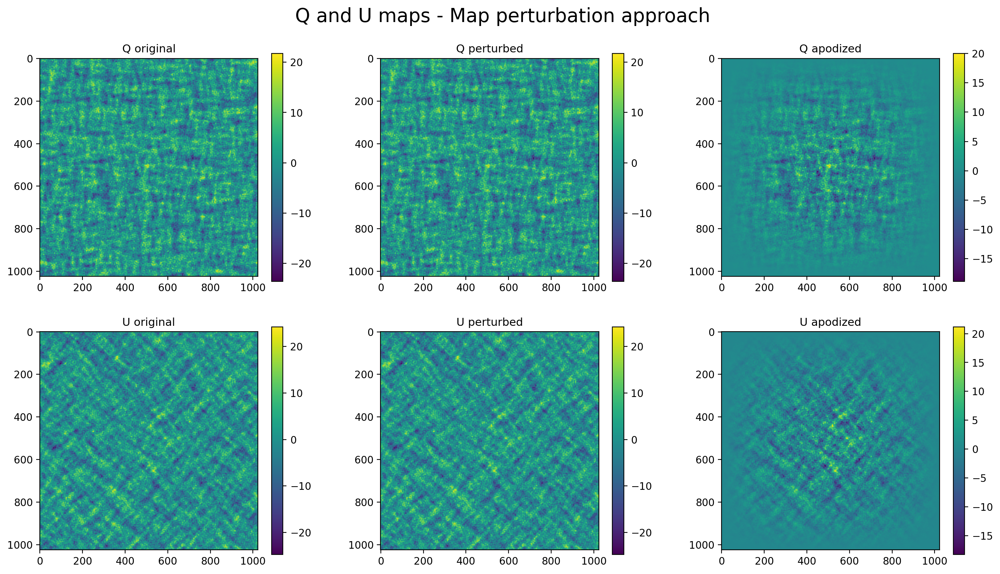

"\nfig, axs = plt.subplots(2, 4, figsize=(18, 10))\naxs      = axs.flatten()\n\n\nfor i, map_data in enumerate(map_list):\n\n        Plot_CMB_Map_compact(axs[i], map_data, c_min/30, c_max/30, X_width, Y_width)\n        axs[i].set_title(title_list[i])\n        \n        \nplt.tight_layout()\nplt.subplots_adjust(wspace=0.25, hspace=0.2, top=0.90)\nplt.suptitle('Polarization angle maps - Map perturbation - r = 0.001', fontsize=20) #  cambio titolo se cambio r \n#plt.savefig('C:/Users/guide/Documents/University/TESI/immagini/Maps_MAPSpert_001.png')  \nplt.show()\n"

In [24]:
Map_to_Plot = [Q_map, Q_map_pert, Q_map_pert_ap, 
               U_map, U_map_pert, U_map_pert_ap]
title = ["Q original", "Q perturbed", "Q apodized", 
         "U original", "U perturbed", "U apodized"]
c_factor_max = [np.max(Map_to_Plot[0]), np.max(Map_to_Plot[1]), np.max(Map_to_Plot[2]), np.max(Map_to_Plot[3]), np.max(Map_to_Plot[4]), np.max(Map_to_Plot[5])]
c_factor_min = [np.min(Map_to_Plot[0]), np.min(Map_to_Plot[1]), np.min(Map_to_Plot[2]), np.min(Map_to_Plot[3]), np.min(Map_to_Plot[4]), np.min(Map_to_Plot[5])]


fig, axs = plt.subplots(2, 3, figsize=(14, 8))
axs      = axs.flatten()
for i, (map_data, c_factor_iter_min, c_factor_iter_max) in enumerate(zip(Map_to_Plot, c_factor_min, c_factor_max)):
    im = axs[i].imshow(map_data, vmin=c_factor_iter_min, vmax=c_factor_iter_max)
    axs[i].set_title(title[i], fontsize = 11)
    plt.colorbar(im, ax=axs[i], orientation='vertical')
    
#fig.delaxes(axs[-1])
plt.tight_layout()
plt.subplots_adjust(wspace=0.25, hspace=0.2, top=0.90)
plt.suptitle(f'Q and U maps - Map perturbation approach', fontsize=19)
plt.show()


'''
fig, axs = plt.subplots(2, 4, figsize=(18, 10))
axs      = axs.flatten()


for i, map_data in enumerate(map_list):

        Plot_CMB_Map_compact(axs[i], map_data, c_min/30, c_max/30, X_width, Y_width)
        axs[i].set_title(title_list[i])
        
        
plt.tight_layout()
plt.subplots_adjust(wspace=0.25, hspace=0.2, top=0.90)
plt.suptitle('Polarization angle maps - Map perturbation - r = 0.001', fontsize=20) #  cambio titolo se cambio r 
#plt.savefig('C:/Users/guide/Documents/University/TESI/immagini/Maps_MAPSpert_001.png')  
plt.show()
'''

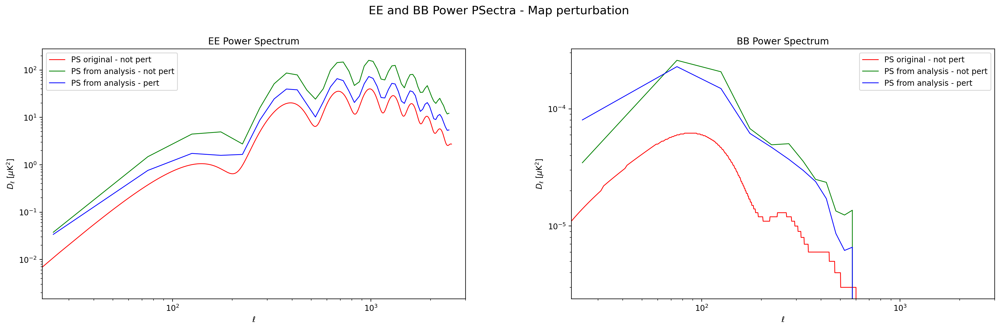

In [25]:
fig, ax = plt.subplots(1, 2, figsize=(18, 6))  


#plt.plot(binned_l_E,binned_spectrum_E* binned_l_E * (binned_l_E+1.)/2. / np.pi,color='b', label="PS from analysis") non corretto

ax[0].loglog(ls,Original_PS[2], label="PS original - not pert", c="r", linewidth=1)
#ax[0].plot(ls,EE_ps_pert, label="PS original - pert", c="purple", linewidth=1)
ax[0].loglog(binned_l_E,(binned_spectrum_E - noise_only_mean_spectrum) * Multiplicative_Bias_est_E*\
             binned_l_E * (binned_l_E+1.)/2. / np.pi,color='green', label="PS from analysis - not pert", linewidth=1)
ax[0].loglog(binned_l_E_pert,(binned_spectrum_E_pert - noise_only_mean_spectrum) * Multiplicative_Bias_est_E_pert*\
             binned_l_E_pert * (binned_l_E_pert+1.)/2. / np.pi,color='blue', label="PS from analysis - pert", linewidth=1)

ax[0].set_title("EE Power Spectrum")
ax[0].set_ylabel('$D_{\ell}$ [$\mu$K$^2$]')
ax[0].set_xlabel('$\ell$')
ax[0].legend()
ax[0].set_xlim(22,3000)

#

ax[1].loglog(ls, BB_ps_tensor, label="PS original - not pert", c="r", linewidth=1)
#ax[1].plot(ls,BB_ps_pert, label="PS original - pert", c="purple", linewidth=1)

ax[1].loglog(binned_l_B,(binned_spectrum_B - noise_only_mean_spectrum) * Multiplicative_Bias_est_B*\
             binned_l_B * (binned_l_B +1.)/2. / np.pi,color='green', label="PS from analysis - not pert", linewidth=1)

ax[1].loglog(binned_l_B_pert,(binned_spectrum_B_pert - noise_only_mean_spectrum) * Multiplicative_Bias_est_B_pert*\
             binned_l_B_pert * (binned_l_B_pert+1.)/2. / np.pi,color='blue', label="PS from analysis - pert", linewidth=1)


ax[1].set_title("BB Power Spectrum")
ax[1].set_ylabel('$D_{\ell}$ [$\mu$K$^2$]')
ax[1].set_xlabel('$\ell$')
ax[1].legend()
ax[1].set_xlim(22,3000)
#

plt.tight_layout()
plt.subplots_adjust(wspace=0.25, hspace=0.2, top=0.85)
plt.suptitle('EE and BB Power PSectra - Map perturbation', fontsize=15)
#plt.savefig('C:/Users/guide/Documents/University/TESI/immagini/PS_MAPSpert_001.png')  #cambio nome
plt.show()

# Salvataggio

In [26]:
stacked_matrices = np.vstack((E_map_pert, B_map_pert,Q_map_pert,U_map_pert))
stacked_PS = np.vstack(((binned_spectrum_E_pert - noise_only_mean_spectrum) * Multiplicative_Bias_est_E_pert*\
             binned_l_E_pert * (binned_l_E_pert+1.)/2. / np.pi, (binned_spectrum_B_pert - noise_only_mean_spectrum) * Multiplicative_Bias_est_B_pert*\
             binned_l_B_pert * (binned_l_B_pert+1.)/2. / np.pi))

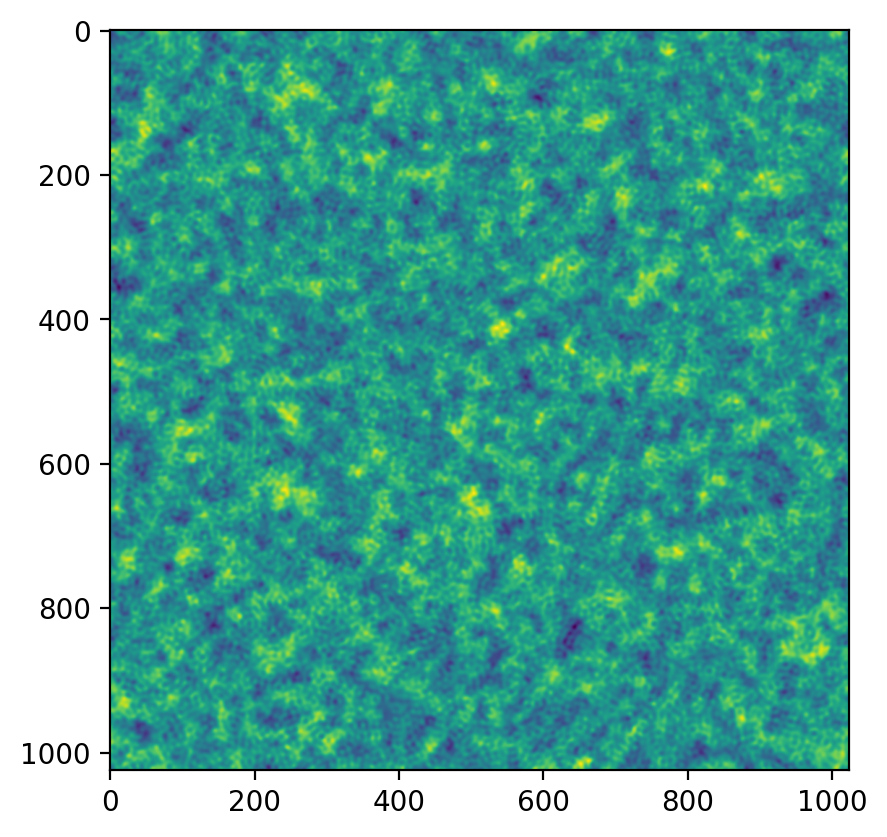

In [27]:
plt.imshow(E_map_pert)

In [28]:
np.shape(stacked_PS)

(2, 50)

In [29]:
np.savetxt('Maps_MAPSpert_001.txt', stacked_matrices, fmt='%.21f')

np.savetxt('EB_PS_MAPSpert_001.txt', stacked_PS, fmt='%.20f')

np.savetxt('binned_l.txt', binned_l_E_pert, fmt='%.20f')

In [30]:
binned_l_E_pert

array([  25,   75,  125,  175,  225,  275,  325,  375,  425,  475,  525,
        575,  625,  675,  725,  775,  825,  875,  925,  975, 1025, 1075,
       1125, 1175, 1225, 1275, 1325, 1375, 1425, 1475, 1525, 1575, 1625,
       1675, 1725, 1775, 1825, 1875, 1925, 1975, 2025, 2075, 2125, 2175,
       2225, 2275, 2325, 2375, 2425, 2475])

In [31]:
binned_l_B_pert

array([  25,   75,  125,  175,  225,  275,  325,  375,  425,  475,  525,
        575,  625,  675,  725,  775,  825,  875,  925,  975, 1025, 1075,
       1125, 1175, 1225, 1275, 1325, 1375, 1425, 1475, 1525, 1575, 1625,
       1675, 1725, 1775, 1825, 1875, 1925, 1975, 2025, 2075, 2125, 2175,
       2225, 2275, 2325, 2375, 2425, 2475])